# Solutions: Lines data

In [1]:
# import modules
import geopandas as gpd
import folium
import json
import branca

## Loading LineString data

Let us work now with *line-shaped* geospatial data using a dataset representing speed limits on various road segments in the Netherlands. 

`geopandas` uses `shapely` *LineString* objects to represent this type of `geometry`; `LineString` objects consists of one or more connected linear splines between points. 

In [2]:
# load only a part of dataset to avoid problems with computational resources
max_speed_df = gpd.read_file('Data/linestring/max_snelheden.shp', rows=2000) 

In [3]:
max_speed_df.head()

,OMSCHR,KANTCODE,WVK_ID,WVK_BEGDAT,BEGAFSTAND,ENDAFSTAND,BEGINTIJD,EINDTIJD,FK_VELD1,FK_VELD4,IZI_SIDE,IBN,geometry
0,30,H,129165005,2014-11-01,0,334,NaN,NaN,012916500520141101,KLK0008311442,L,I,"LINESTRING (64557.000 382675.000, 64669.000 38..."
1,30,H,191191019,2014-11-01,0,104,NaN,NaN,019119101920141101,KLK0008311153,L,I,"LINESTRING (95747.000 395869.000, 95843.706 39..."
2,100,H,315388011,2014-11-01,0,91,6.0,19.0,031538801120141101,KLK0008638133,R,I,"LINESTRING (157668.000 494178.000, 157724.021 ..."
3,130,H,315388011,2014-11-01,0,91,19.0,6.0,031538801120141101,KLK0008638132,R,I,"LINESTRING (157668.000 494178.000, 157724.021 ..."
4,100,H,406338025,2014-11-01,0,125,6.0,19.0,040633802520141101,KLK0008630677,R,I,"LINESTRING (203341.692 469190.184, 203385.000 ..."


This time the "OMSCHR" column represent the speed limits on the road segment, geometrically defined by the linestrings rightmost "geometry" column.

The first linestring is defined by a sequence of 3 points

In [4]:
print(max_speed_df.geometry[0])

LINESTRING (64557 382675, 64669 382599, 64831 382484)


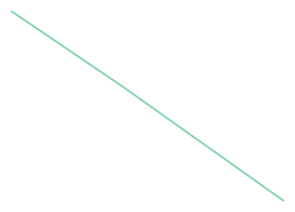

In [5]:
max_speed_df.geometry[0]

Remember that we can always use `geopandas` functionalities to extract interesting information from our `geometry` column, such as the length of each road segment:

In [6]:
max_speed_df.length

0       334.019459
1       103.864960
2        90.937556
3        90.937556
4       124.713937
           ...    
1995    101.908700
1996    415.149002
1997    108.740314
1998    167.675914
1999    164.994709
Length: 2000, dtype: float64

## LineString visualization

Let's create a base map centered with respect to the road coordinates in our GeoDataFrame. We do this by first computing the average coordinate of each `LineString`. Since `folium` default CRS is "EPSG:4326", we need to transform our geometries accordingly, using the `to_crs` method.

In [7]:
max_speed_df.geometry.head()

0    LINESTRING (64557.000 382675.000, 64669.000 38...
1    LINESTRING (95747.000 395869.000, 95843.706 39...
2    LINESTRING (157668.000 494178.000, 157724.021 ...
3    LINESTRING (157668.000 494178.000, 157724.021 ...
4    LINESTRING (203341.692 469190.184, 203385.000 ...
Name: geometry, dtype: geometry

In [8]:
transformed_geometries = max_speed_df.geometry.to_crs('EPSG:4326')
transformed_geometries.head()

0    LINESTRING (4.08674 51.42593, 4.08837 51.42527...
1      LINESTRING (4.53293 51.54866, 4.53432 51.54901)
2      LINESTRING (5.42644 52.43538, 5.42726 52.43603)
3      LINESTRING (5.42644 52.43538, 5.42726 52.43603)
4    LINESTRING (6.09446 52.20869, 6.09509 52.20882...
Name: geometry, dtype: geometry

The `bounds` attribute returns a (minx, miny, maxx, maxy) tuple (float values) that bounds each geometric object.

In [9]:
transformed_geometries.bounds.head()

,minx,miny,maxx,maxy
0,4.086744,51.424261,4.090731,51.425934
1,4.532934,51.548657,4.534322,51.549008
2,5.426437,52.435384,5.427262,52.436028
3,5.426437,52.435384,5.427262,52.436028
4,6.094457,52.208690,6.096221,52.208965


We can use this information to find the central point of each bounding box for each road, and compute the overall latitude and longitude.

In [10]:
avg_latitude = ((transformed_geometries.bounds.maxy+transformed_geometries.bounds.miny)/2).mean()
avg_longitude = ((transformed_geometries.bounds.maxx+transformed_geometries.bounds.minx)/2).mean()

In [11]:
# create
nl_map = folium.Map(
    location=[avg_latitude,avg_longitude],
    zoom_start=10
)

# display
nl_map

Similar to what seen for the Point data, we can draw all the `LineString` objects on `GeoJson` object sitting on top of the base map.

In [12]:
# create
gjson = folium.features.GeoJson(
    max_speed_df).add_to(nl_map)

# display
nl_map

We can make the plot more informative by changing the line colors according to speed limits.

First, we create a color map using the [branca](https://github.com/python-visualization/branca) Python library; `branca` is a *spinoff* from `folium` hosting non-map-specific features such as colormaps. 

In this case, we use a linear colormap going from Red (Rd) to Blue (Bu) through Yellow (Yl). We scale the colors between the min and max reported speeds by using the `vmin` and `vmax` arguments.

In [13]:
colors = branca.colormap.linear.RdYlBu_11.scale(vmin=max_speed_df.OMSCHR.min(), vmax=max_speed_df.OMSCHR.max())
colors

To customise the visualisation of each `LineString`, we define and apply a `style_function` to all rows of the GeoDataFrame (similar to what happens when using the `pandas.DataFrame.apply` construct). 

The main difference is that the rows of the GeoDataFrame, as passed by `folium` to our `style_function`, are now encoded in the underlying JSON format. Their data is now stored into a `properties` dictionary.

The `style_function` returns a dictionary of attributes computed for each row, to be applied to the relative `geometry` visualized using `folium`. In particular, the function below sets the color according to the speed limit of each row (e.g., road) and the colorscale we defined before. The function and also fix the values for the opacity of each plotted segment and the weight (e.g., thickness).

In [14]:
def style_function(row):
    return {
        "color": colors(row['properties']['OMSCHR']),
        "fillOpacity": 0.5,
        "weight": 5,        
    }

Now, we can create another overlay with the customised style settings

In [15]:
# create
gjson = folium.features.GeoJson(
    max_speed_df,
    style_function=style_function,
).add_to(nl_map)

# display
nl_map

Finally, we can show extra information using "pop-up" windows.

In [16]:
# create
folium.features.GeoJsonPopup(
    fields=['WVK_ID', 'OMSCHR'],
    aliases=['Segment_ID', 'Maximum speed'],
    labels=True
).add_to(gjson)

# display
nl_map

## Exercise

You are given a geospatial dataset for the roads in Vietnam

In [17]:
df_vietroads = gpd.read_file('./Data/case_study/vietnam_roadnet.geojson')

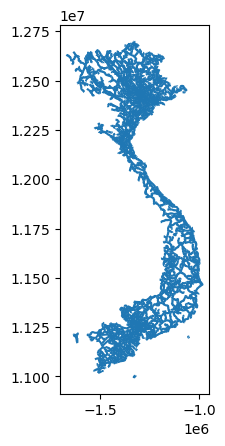

In [18]:
df_vietroads.plot();

The dataset contains geometrical information on the location of the road along with contextual data such as information on the road type ("rtt" column)

In [19]:
df_vietroads.head()

,f_code,acc,exs,med,rtt,rsu,loc,soc,rst,geometry
0,AP030,1,28,0,999,1,8,VNM,1,"LINESTRING (-1324896.810 11005706.981, -132519..."
1,AP030,1,28,0,999,1,8,VNM,2,"LINESTRING (-1512457.120 11017791.650, -151150..."
2,AP030,1,28,0,999,1,8,VNM,2,"LINESTRING (-1493643.977 11027505.705, -149304..."
3,AP030,1,28,0,14,1,8,VNM,2,"LINESTRING (-1512457.120 11017791.650, -151123..."
4,AP030,1,28,0,999,1,8,VNM,2,"LINESTRING (-1509640.460 11037037.887, -151075..."


In [20]:
df_vietroads.rtt.value_counts().sort_index()

14     1572
15     1439
16      272
999    1252
Name: rtt, dtype: int64

Your task is to use `folium` as shown earlier in the notebook to display a map for the roads of Vietnam where:

1. The map is centered on Hanoi, e.g. `latitude = 21.03 N`, `longitude = 105.8 E`;
2. Each road type "rtt" is displayed with a different color. The following colors (in hexadecimal format) are assigned to each road type 
    - 14: `#E74C3C`
    - 15: `#28B463`
    - 16: `#85C1E9`
    - 999:`#2C3E50`
3. Colors are assigned with `folium.features.GeoJson` using a `style_function`;
4. The map has pop-up windows enabled showing information on "rtt".

> Hints: Remember to transform the crs of the loaded dataset to the one used by `folium`. Instead of using a `branca` colormap, you can simply use a dictionary mapping different road types to the selected colors.

### Solution

In [21]:
- = df_vietroads.to_crs("EPSG:4326")

def color_roads(row):
    # define color
    colors_dict = {14: '#E74C3C', 15: '#28B463', 16: '#85C1E9', 999:'#2C3E50'}
    return {
        "color": colors_dict[row['properties']['rtt']],        
        "weight": 2,        
    }


# create base map
vtn_map = folium.Map(
    location=[21.03, 105.8],
    zoom_start=5
)

# add road layer
gjson = folium.features.GeoJson(
    df_vietroads,
    style_function=color_roads,
).add_to(vtn_map)

# add pop-up windows
folium.features.GeoJsonPopup(
    fields=['rtt']
).add_to(gjson)

# display
vtn_map